## **Fig2k,l** ##
**One can compute Eigengene and Hotspot in this notebook or read a prepared one**

In [166]:
import scanpy as sc
import matplotlib.pyplot as plt
import scvelo as scv
import numpy as np

In [167]:
data_name = 'EG_ab_bin'
# data_name = ''
[k_nei, K, L] = [10, 3, 6]
result_path = 'main_results/'+data_name+' '+str([k_nei,K,L])+'/'
figure_path = result_path
cmap = plt.colormaps['Spectral']

adata0 = sc.read_h5ad('data/'+data_name+'.h5ad')
adata = adata0.copy()

In [168]:
import os

folder = os.path.exists(result_path)
if not folder:                   #判断是否存在文件夹如果不存在则创建为文件夹
    os.makedirs(result_path)            #makedirs 创建文件时如果路径不存在会创建这个路径

In [169]:
adata

AnnData object with n_obs × n_vars = 2322 × 514
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta', 'palantir_pseudotime', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'highly_variable_genes', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'clusters_colors', 'clusters_fine_colors', 'log1p', 'louvain_Alpha_colors', 'louvain_Beta_colors', 'neighbors', 'pca', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_pca'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'

## **Data Visualization** 

In [170]:
# cmap = plt.colormaps['Spectral']
# fig = sc.pl.embedding(
#     adata,
#     color=['crc', "Cell_type"],
#     basis="umap",
#     color_map=cmap,
#     return_fig=True
# )
# fig.savefig(result_path+'output_umap.png')

## **Preprocessing**

In [171]:
from scipy.sparse import csr_matrix

sc.pp.pca(adata, n_comps=50)
sc.pp.neighbors(adata, n_neighbors=k_nei)
scv.pp.moments(adata, n_pcs=50, n_neighbors=k_nei)
scv.tl.velocity(adata)

gene_arr = adata.var.index.values
X_pca = adata.obsm['X_pca']
X_umap = adata.obsm['X_umap']
Xs = adata.layers['Ms'] #adata.X.A#
# Xs = adata.layers['M_s'] #如果是EG_ab_dyn
X = Xs

row = np.array([np.ones((k_nei,))*i for i in range(adata.shape[0])]).flatten()
col = (adata.obsp['distances']+csr_matrix(np.eye(adata.obsp['distances'].shape[0]))).indices
w_val = np.array([np.linalg.norm(X_pca[int(i),:]-X_pca[int(j),:]) for i,j in zip(row,col)])
adj_val = np.ones(col.shape)
A_mat = csr_matrix((adj_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))
W_mat = csr_matrix((w_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))

dc=np.amax(adata.obsp['distances'])
cell_nei=adata.obsp['distances'].indices.reshape([-1,k_nei-1])
nei_w=[]
rho_arr=[]
for i in range(cell_nei.shape[0]):
    dij=np.array([np.linalg.norm(X_pca[i,:]-X_pca[int(j),:]) for j in cell_nei[i]])
    
    rho=np.sum(np.exp(-dij**2/dc**2))
    nei_w.append(np.exp(-dij**2/dc**2)/rho)
    rho_arr.append(rho)
rho_arr=np.array(rho_arr)/np.amax(rho_arr)
nei_w=np.array(nei_w)

computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [172]:
def smooth_func(X_val,cell_nei=cell_nei,nei_w=nei_w):
    X_s=X_val.copy()
    for ci in range(len(X_val)):
        X_s[ci]=np.dot(X_val[cell_nei[ci,:]],nei_w[ci,:])
    return(X_s)

def wasserstein_distance(mu1,sigma1,mu2,sigma2):
    dim=len(mu1)
    dmu=mu1-mu2
    W_dist2=0
    for i in range(dim):
        W_dist2+=dmu[i]**2+sigma1[i]**2+sigma2[i]**2-2*np.sqrt(sigma2[i]*sigma1[i]**2*sigma2[i])
    W_dist=np.sqrt(W_dist2+1e-12)
    return W_dist

In [173]:
X_umap = adata.obsm['X_umap']
X_plt = X_umap[:,0]
Y_plt = X_umap[:,1]
X_min = np.min(X_plt)
X_max = np.max(X_plt)
Y_min = np.min(Y_plt)
Y_max = np.max(Y_plt)
X_len = (X_max-X_min)/5
Y_len = (Y_max-Y_min)/5
wid = min(X_len,Y_len)/30
X_ori = X_min
Y_ori = Y_min

## **CRC**

In [174]:
from utils import *
from g2g_model_Fisher import *

In [175]:
epochs = 400
nsamples = 5
learning_rate = 1e-3
seed = 0
# n_workers = 4

if seed is not None:
    reset_seeds(seed)

A = A_mat
A = A.astype(np.float32)
X = Xs.astype(np.float32)
z = np.zeros(adata.n_obs)

n = A.shape[0]
train_nodes, val_nodes = train_test_split(n, train_ratio=1.0)
A_train = A[train_nodes, :][:, train_nodes]
X_train = X[train_nodes]
z_train = z[train_nodes]
A_val = A[val_nodes, :][:, val_nodes]
X_val = X[val_nodes]
z_val = z[val_nodes]

train_data = AttributedGraph(A_train, X_train, z_train, K)
val_data = AttributedGraph(A_val, X_val, z_val, K)

encoder = Encoder(X.shape[1], L)

In [176]:
optimizer = optim.Adam(encoder.parameters(), lr=learning_rate)

iterations = epochs #// n_workers
dataset = GraphDataset(train_data, nsamples, iterations)
loader = DataLoader(
    dataset,
    batch_size=1,
#     num_workers=n_workers,
    worker_init_fn=reset_seeds,
    collate_fn=lambda args: args,
)

In [177]:
# for batch_idx, data in enumerate(loader):
#     encoder.train()
#     optimizer.zero_grad()

#     # compute weighted loss
#     _ ,i,j,k,w,nsamples = data[0][0],data[0][1],data[0][2],data[0][3],data[0][4],data[0][5]

#     mu, sigma = encoder.forward(data[0][0])

#     mu_i = gather_rows(mu, i)
#     sigma_i = gather_rows(sigma, i)
#     mu_j = gather_rows(mu, j)
#     sigma_j = gather_rows(sigma, j)
#     mu_k = gather_rows(mu, k)
#     sigma_k = gather_rows(sigma, k)

#     diff_ij = mu_i - mu_j
#     ss_ij = sigma_i + sigma_j
#     ds_ij = sigma_i - sigma_j
    
#     closer = 2*((torch.log (
        
#         (torch.sqrt(0.5*diff_ij**2+ss_ij**2+1e-10)+torch.sqrt(0.5*diff_ij**2+ds_ij**2+1e-10)+1e-10)/\
#         torch.abs((torch.sqrt(0.5*diff_ij**2+ss_ij**2+1e-10)-torch.sqrt(0.5*diff_ij**2+ds_ij**2+1e-10)+1e-10)
#         +1e-10)
#             ))**2).sum(axis=-1)

#     diff_ik = mu_i - mu_k
#     ss_ik = sigma_i + sigma_k
#     ds_ik = sigma_i - sigma_k
    
#     apart = 2*((torch.log (
        
#         (torch.sqrt(0.5*diff_ik**2+ss_ik**2+1e-10)+torch.sqrt(0.5*diff_ik**2+ds_ik**2+1e-10)+1e-10)/\
#         torch.abs((torch.sqrt(0.5*diff_ik**2+ss_ik**2+1e-10)-torch.sqrt(0.5*diff_ik**2+ds_ik**2+1e-10)+1e-10)
#         +1e-10)
#             ))**2).sum(axis=-1)

#     # E = closer*weight[i,j] + torch.exp(-torch.sqrt(apart))*weight[i,k] 
#     E = closer + torch.exp(-torch.sqrt(apart)) 

#     loss = E.dot(w) / nsamples
#     if batch_idx% 10 == 0:
#         print(batch_idx,loss)
#     loss.backward()
#     optimizer.step()

# torch.save(encoder,result_path+'encoder.pt')

In [178]:
encoder = torch.load(result_path+'encoder.pt')

mu, sigma = encoder(torch.tensor(X))
mu_learned = mu.detach().numpy()
sigma_learned = sigma.detach().numpy()

Fisher_g=np.zeros((X.shape[0],L*2,L*2))
for i in range(X.shape[0]):
    for j in range(L):
        Fisher_g[i,j,j]=1/sigma_learned[i,j]**2
        Fisher_g[i,L+j,L+j]=2/sigma_learned[i,j]**2

Fisher_g_diag = np.zeros([X.shape[0],L*2])
for i in range(X.shape[0]):
    Fisher_g_diag[i] = np.diag(Fisher_g[i])

In [179]:
cRc_arr=[]
cRc_arr_eu=[]
A = A_mat
A = csr_matrix(A + np.eye(A.shape[0]))
for inds in np.split(A.indices, A.indptr)[1:-1]:
    self_ind=inds[0]
    cRc=0
    cRc_eu=0
    for nei_k in range(1,len(inds)):

        dEu=np.linalg.norm(X[self_ind,:]-X[inds[nei_k],:])
        dFi=Fisher_dist(mu_learned[self_ind,:],sigma_learned[self_ind,:],\
                        mu_learned[inds[nei_k],:],sigma_learned[inds[nei_k],:])
        dWa=wasserstein_distance(mu_learned[self_ind,:],sigma_learned[self_ind,:],\
                        mu_learned[inds[nei_k],:],sigma_learned[inds[nei_k],:])

        cRc+=1-dWa/dFi
        cRc_eu+=1-dWa/dEu

    cRc_arr.append(cRc/len(inds))
    cRc_arr_eu.append(cRc_eu/len(inds))
crc = np.array(cRc_arr)
crc_eu = np.array(cRc_arr_eu)
crc_smooth = smooth_func(crc_eu)

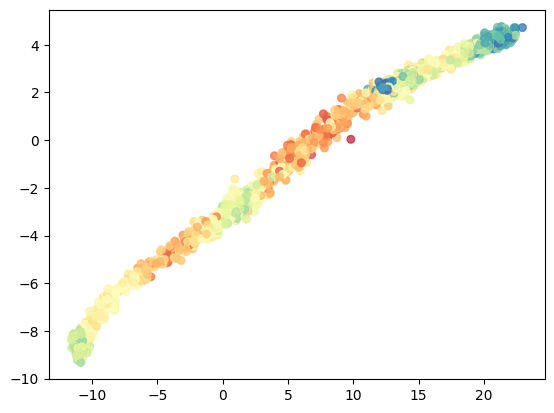

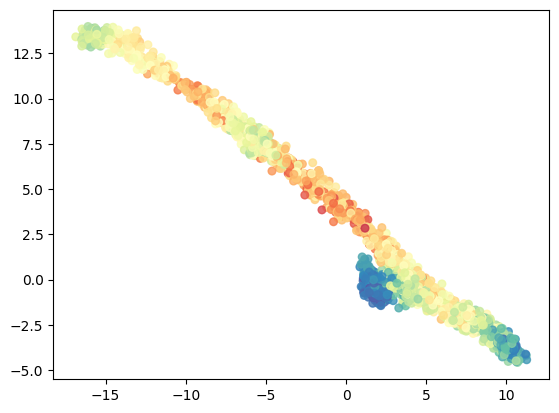

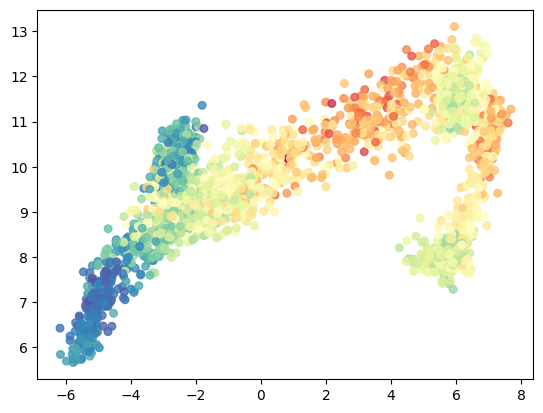

In [180]:
Z_latent = np.hstack([mu_learned, sigma_learned])
plt.scatter(Z_latent[:,0],Z_latent[:,1],c=crc_smooth,s=30,alpha=0.8,cmap=cmap)
plt.show()
plt.scatter(Z_latent[:,2],Z_latent[:,3],c=crc_smooth,s=30,alpha=0.8,cmap=cmap)
plt.show()
plt.scatter(Z_latent[:,4],Z_latent[:,5],c=crc_smooth,s=30,alpha=0.8,cmap=cmap)
plt.show()

In [181]:
if data_name == 'zebrafish_dynamo_part':    
    adata.obs['crc_smooth'] = crc_smooth
    fig = sc.pl.embedding(
        adata,
        color=['crc_smooth', "Cell_type"],
        basis="umap",
        color_map=cmap,
        return_fig=True
    )
    fig.savefig(result_path+'sc_crc_umap.png')

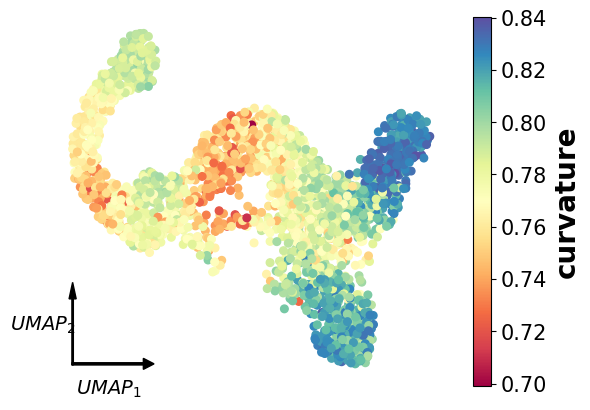

In [182]:
idx = ~np.isnan(crc_smooth)
cmap = plt.colormaps['Spectral']
plt.scatter(X_plt[idx],Y_plt[idx],c=crc_smooth[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('curvature',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*21,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'crc_smooth')
plt.show()


In [183]:
np.save(result_path+'/crc_smooth', crc_smooth)

In [184]:
adata

AnnData object with n_obs × n_vars = 2322 × 514
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta', 'palantir_pseudotime', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'highly_variable_genes', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'clusters_colors', 'clusters_fine_colors', 'log1p', 'louvain_Alpha_colors', 'louvain_Beta_colors', 'neighbors', 'pca', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_pca'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'

## 

## **IV**

**velo_pca**

In [185]:
velo0 = np.array(adata.layers['velocity'])
velo_g = np.zeros(velo0.shape)
velo_g[:,adata.var['velocity_genes']] = velo0[:,adata.var['velocity_genes']]
velo_pca = velo_g@adata.varm['PCs']

In [186]:
#------use a simple neural network to study dmu/dt and dsigma/dt
latent_z = np.hstack((mu_learned,sigma_learned))
pca_dim = 50
learning_rate = 1e-3

model = nn.Sequential(
    nn.Linear(pca_dim, 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,2*L),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

x_in=torch.tensor(X_pca.astype(np.float32))
x_out=torch.tensor(latent_z.astype(np.float32))
# Train the model
for epoch in range(200):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
#     if epoch% 10 == 9:
#         print(epoch,loss)
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

pZ_pX = np.zeros([X.shape[0], L*2, X_pca.shape[1]])

# Compute the gradients
for i in range(X.shape[0]):
    x0=torch.tensor(X_pca[i,:],requires_grad=True)
    z=model(x0)
    for j in range(2*L):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pZ_pX[i,j,:] = x0.grad.detach()

Z_velo = np.array([pZ_pX[i]@velo_pca[i] for i in range(X.shape[0])])

zv2 = np.zeros(X.shape[0])
for i in range(X.shape[0]):
    for j in range(L):
        # zv2[i] += Fisher_g[i,2*j,2*j]*Z_velo[i,2*j]**2 + Fisher_g[i,2*j+1,2*j+1]*Z_velo[i,2*j+1]**2
        zv2[i] += Fisher_g[i,j,j]*Z_velo[i,j]**2 + Fisher_g[i,L+j,L+j]*Z_velo[i,L+j]**2
zv1 = np.sqrt(zv2)
zv1_smooth = smooth_func(zv1)

In [187]:
adata.obs['IV_pca'] = zv1_smooth

In [188]:
if data_name == 'zebrafish_dynamo_part':
    adata.obs['crc_smooth'] = crc_smooth
    fig = sc.pl.embedding(
        adata,
        color=['crc_smooth', 'IV_pca', "Cell_type"],
        basis="umap",
        color_map=cmap,
        return_fig=True
    )

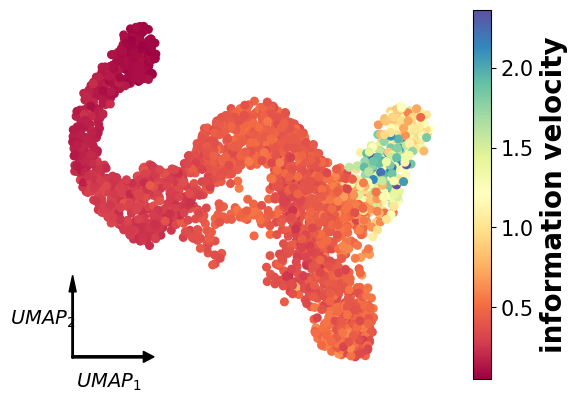

In [189]:
idx = ~np.isnan(zv1_smooth)
cmap = plt.colormaps['Spectral']
plt.scatter(X_plt[idx],Y_plt[idx],c=zv1_smooth[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('information velocity',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*21,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'iv_smooth')
plt.show()

In [190]:
np.save(result_path+'/iv_smooth', zv1_smooth)

## **Fisher**

In [191]:
eigs = np.zeros((X.shape[0],2*L))
eigvecs = np.zeros((X.shape[0],2*L, 2*L))
for i in range(X.shape[0]):
    eig, eigvec = np.linalg.eig(Fisher_g[i])
    sorted_indices = np.argsort(eig)[::-1]  # 从大到小排序
    eigs[i] = eig[sorted_indices]
    eigvecs[i] = eigvec[sorted_indices]

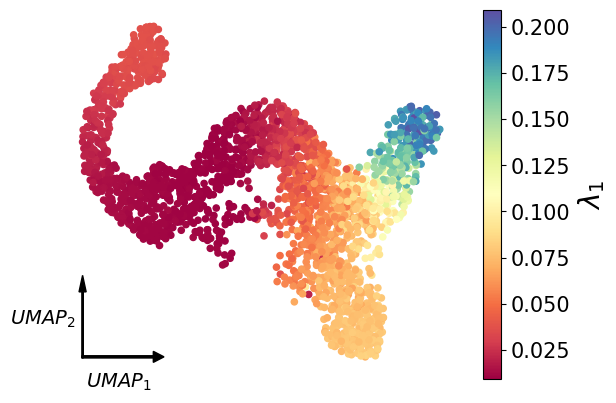

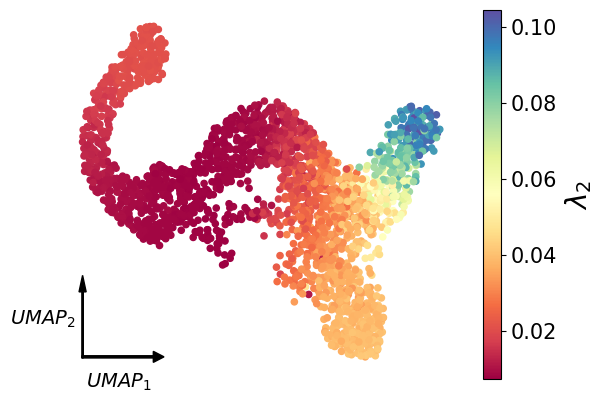

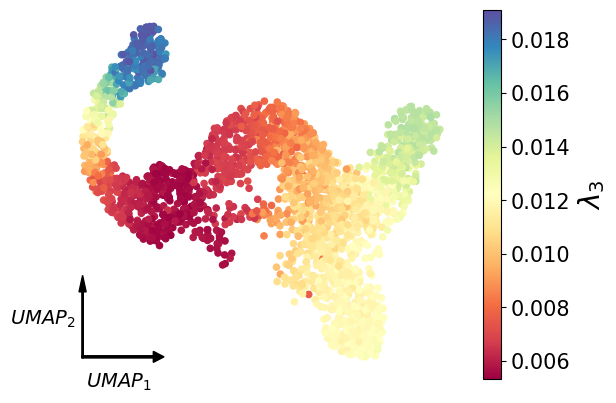

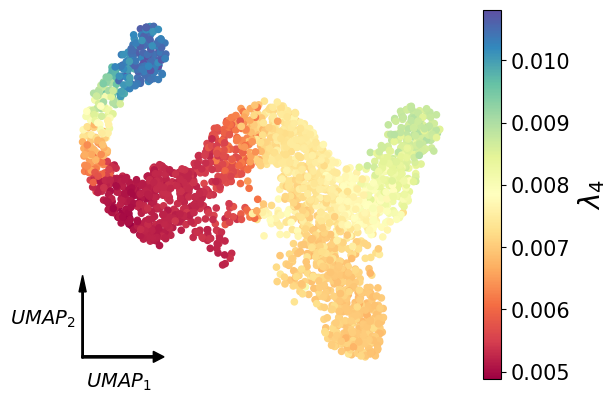

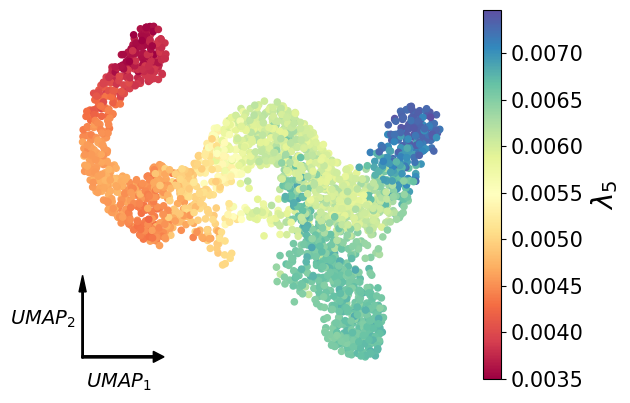

...

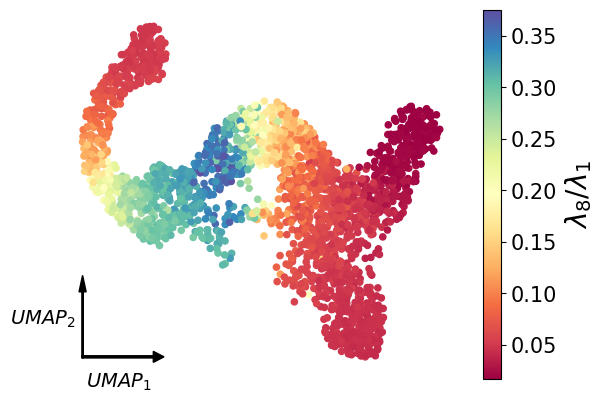

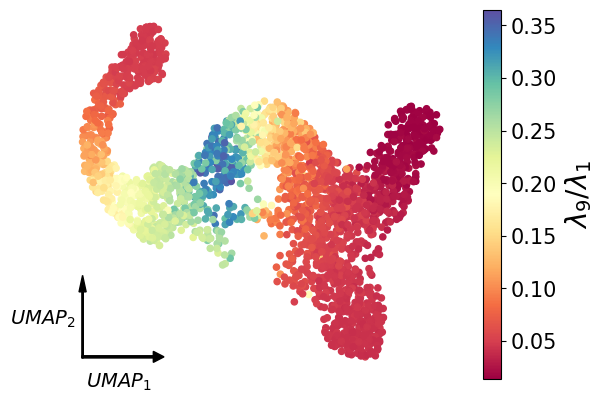

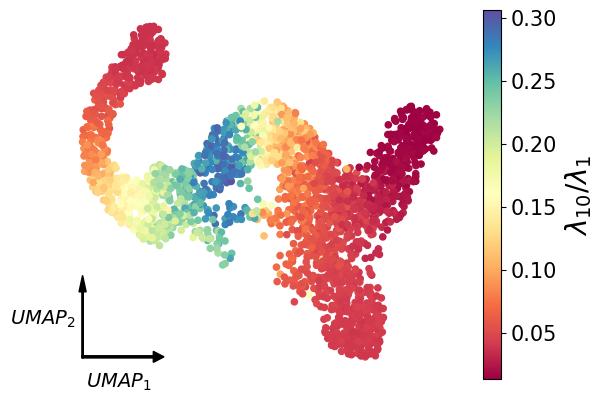

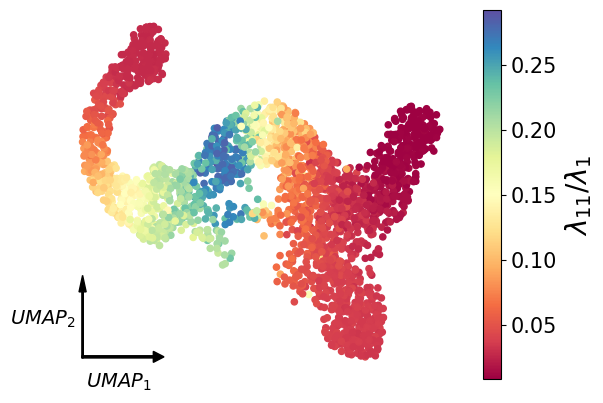

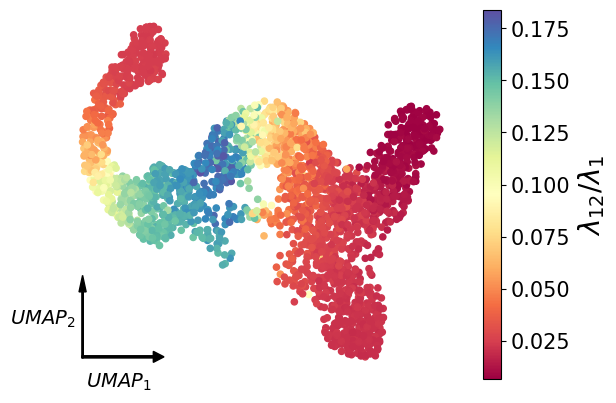

In [192]:


for k in range(0,2*L):
    cmap = plt.colormaps['Spectral']
    plt.scatter(X_plt[idx],Y_plt[idx], c=smooth_func(eigs[:,k]), cmap=cmap, s=20)
    plt.axis('off')

    clb=plt.colorbar()
    clb.ax.set_ylabel(f'$\lambda_{k+1}$',fontsize=20,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)
    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
    plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
    plt.text(X_ori-wid*28,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

    plt.savefig(result_path+f'eig_latent_{k+1}')
    plt.show()

for k in range(1,2*L):
    cmap = plt.colormaps['Spectral']
    plt.scatter(X_plt[idx],Y_plt[idx], c=smooth_func(eigs[:,k]/eigs[:,0]), cmap=cmap, s=20)
    plt.axis('off')

    clb=plt.colorbar()
    clb.ax.set_ylabel(rf'$\lambda_{{{k+1}}}/\lambda_{1}$',fontsize=20,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)

    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
    plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
    plt.text(X_ori-wid*28,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

    plt.savefig(result_path+f'eig_ratio_latent_{k+1}')
    plt.show()

In [193]:
np.save(result_path+'/fisher_latent', Fisher_g)
np.save(result_path+'/eig_latent', eigs)
np.save(result_path+'/eigvec_latent', eigvecs)

## **Fisher pca**

In [268]:
Fisher_pca = np.zeros((X.shape[0],pca_dim, pca_dim))
for i in range(X.shape[0]):
    Fisher_pca[i] = pZ_pX[i].T@Fisher_g[i]@pZ_pX[i]

In [232]:
eigs_pca = np.zeros((X.shape[0],pca_dim))
eigvecs_pca = np.zeros((X.shape[0],pca_dim, pca_dim))
for i in range(X.shape[0]):
    eig, eigvec = np.linalg.eig(Fisher_pca[i])
    sorted_indices = np.argsort(eig)[::-1]  # 从大到小排序
    eigs_pca[i] = eig[sorted_indices]
    eigvecs_pca[i] = eigvec[sorted_indices]

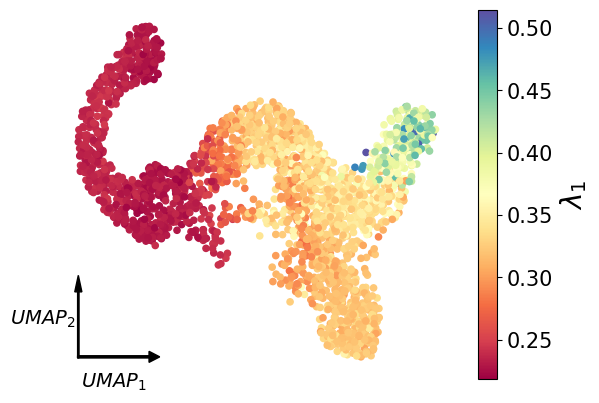

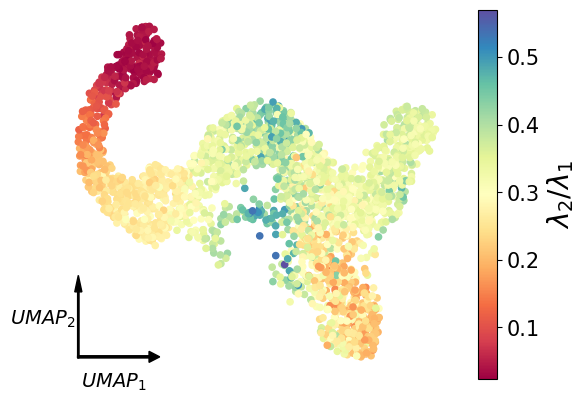

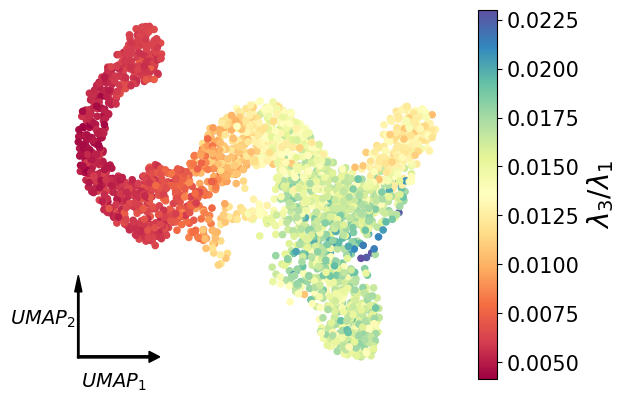

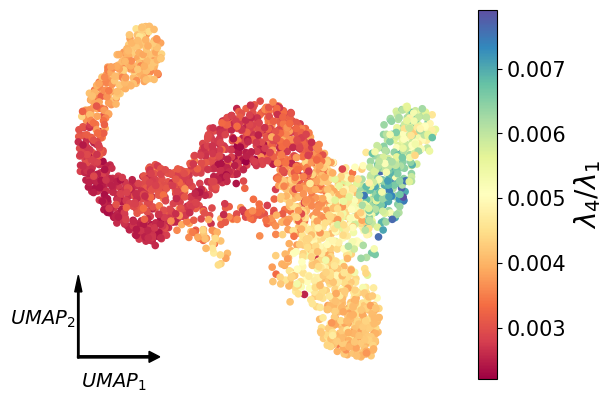

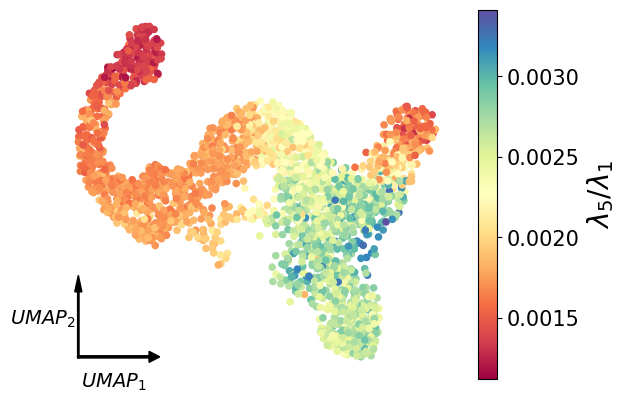

...

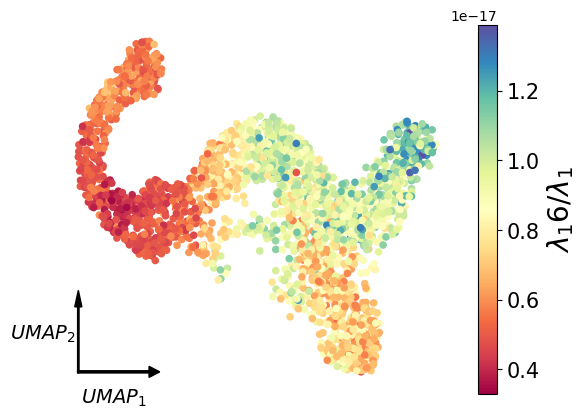

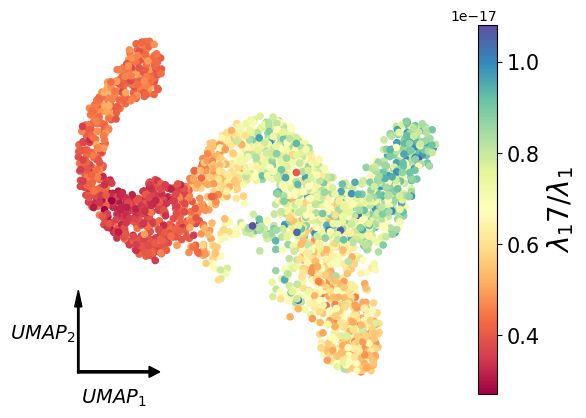

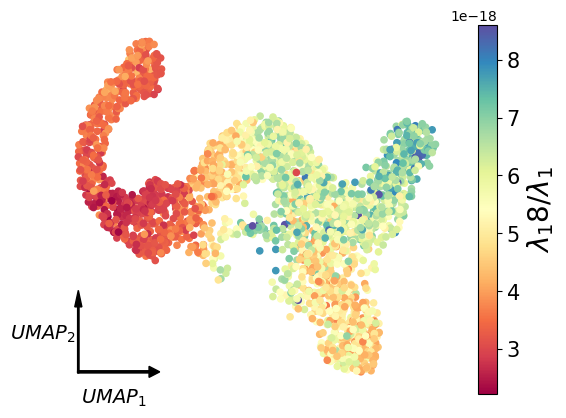

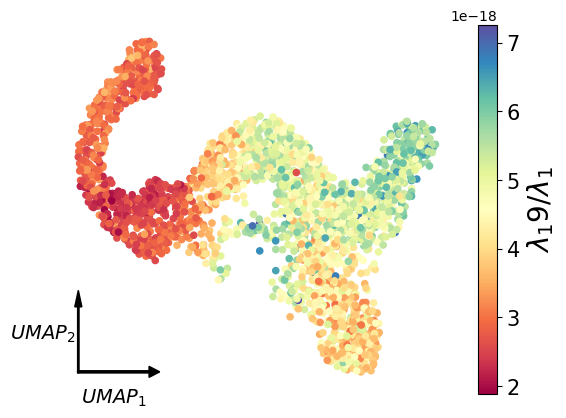

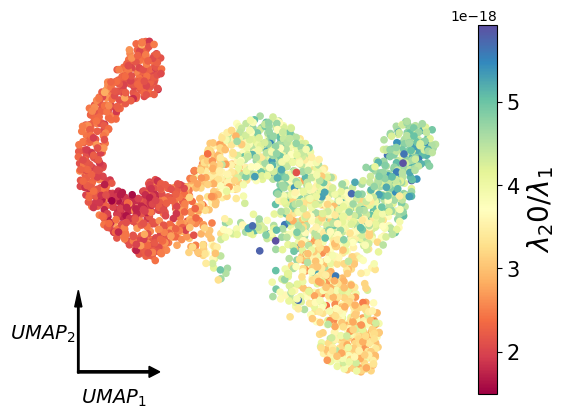

In [233]:
cmap = plt.colormaps['Spectral']
plt.scatter(X_plt[idx],Y_plt[idx], c=smooth_func(eigs_pca[:,0]), cmap=cmap, s=20)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel(f'$\lambda_{1}$',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*25,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+f'eig_pca_{1}')
plt.show()

for k in range(1,20):
    cmap = plt.colormaps['Spectral']
    plt.scatter(X_plt[idx],Y_plt[idx], c=smooth_func(eigs_pca[:,k]/eigs_pca[:,0]), cmap=cmap, s=20)
    plt.axis('off')

    clb=plt.colorbar()
    clb.ax.set_ylabel(f'$\lambda_{k+1}/\lambda_{1}$',fontsize=20,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)

    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
    plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
    plt.text(X_ori-wid*25,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

    plt.savefig(result_path+f'eig_ratio_pca_{k+1}')
    plt.show()

In [234]:
np.save(result_path+'/fisher_pca', Fisher_pca)
np.save(result_path+'/eig_pca', eigs_pca)
np.save(result_path+'/eigvec_pca', eigvecs_pca)

## **Eigen gene**

In [235]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy.cluster.hierarchy import fcluster,leaders
from sklearn.decomposition import PCA
from scipy.linalg import inv
from scipy.cluster.hierarchy import dendrogram, linkage

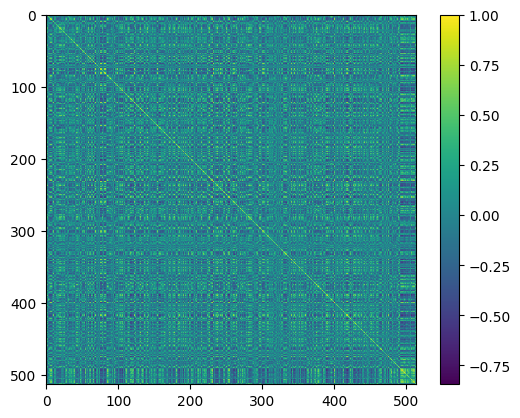

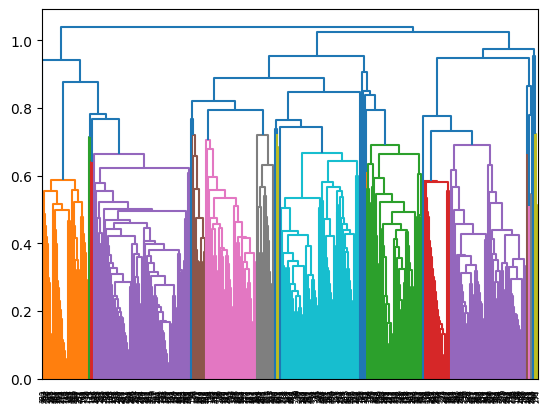

In [236]:
scaler=StandardScaler()
X=scaler.fit_transform(Xs)

X_corr=np.corrcoef(X, rowvar=False)
plt.imshow(X_corr)
plt.colorbar()
plt.show()

Z=linkage((1-X_corr)[np.triu_indices(X_corr.shape[0],k=1)],method='weighted')#method='weighted')
dg=dendrogram(Z)
X_re= X[:,dg['leaves']]#X_re reorder X by clustering

X_corr_re=np.corrcoef(X_re, rowvar=False)
plt.show()

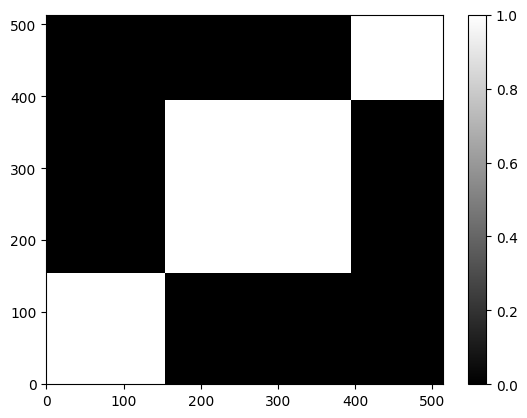

In [237]:
td = 0.98 # 0.95 for processed10
T = fcluster(Z, t=td, criterion='distance')
# T=fcluster(Z, t=td, criterion='maxclust')
T_re = T[dg['leaves']]

X_corr_label = np.zeros(X_corr_re.shape)
for i in range(X_corr_re.shape[0]):
    label_ind = np.where(T_re==T_re[i])[0]
    X_corr_label[i,label_ind] = 1

plt.imshow(X_corr_label, aspect='auto', cmap=plt.cm.gray, interpolation='nearest',origin='lower')
plt.colorbar()
plt.show()

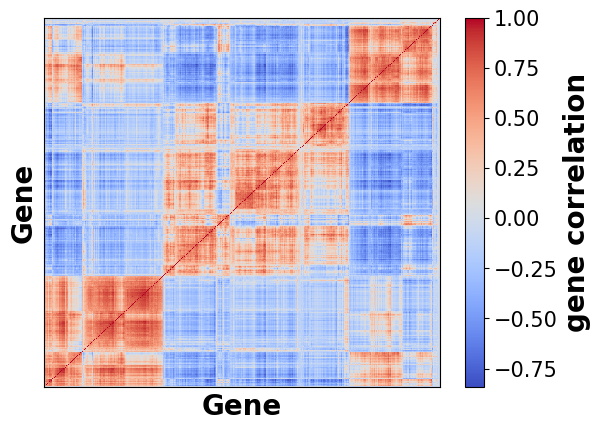

In [238]:
# plt.figure(figsize=(9,6))
plt.imshow(X_corr_re, aspect='auto', cmap=plt.cm.coolwarm, interpolation='nearest',origin='lower')
# plt.imshow(X_corr_re, aspect='auto', cmap=plt.cm.gray, interpolation='nearest',origin='lower')

plt.xlabel('Gene',fontsize=20,fontweight='bold')
plt.ylabel('Gene',fontsize=20,fontweight='bold')
plt.xticks([])
plt.yticks([])
# plt.xticks(fontsize=15)#,fontweight='bold')
# plt.yticks(fontsize=15)#,fontweight='bold')

clb = plt.colorbar()
clb.ax.set_ylabel('gene correlation',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)

# alphas = X_corr_label.copy()
# alphas[X_corr_label==1] = 0
# alphas[X_corr_label==0] = 0.5
# plt.imshow(X_corr_label, aspect='auto', cmap=plt.cm.gray, interpolation='nearest',origin='lower',alpha=alphas)

# plt.savefig(result_path+'3f.png',dpi=600,bbox_inches='tight')
plt.show()

In [239]:
# eigen gene is the value of first principal component of each community
def eigen_gene(X_re,T_re):#return the weights of each gene in correponding eigen gene
    eigen_X_w=[]
    for i in np.unique(T_re):
        if i == -1:
            continue
        if (X_re[:,T_re==i]).shape[1] <= 1:
            continue

        pca=PCA(n_components=2).fit(X_re[:,T_re==i])
        print(pca.explained_variance_ratio_)
        eigen_X_w.append(pca.components_[0,:])
#         eigen_gene_size.append(np.where(T_re==i)[0].shape[0])
    return eigen_X_w

In [240]:
eigen_X_w = eigen_gene(X_re,T_re)
eigen_dim=len(eigen_X_w)
print(eigen_dim)

[0.5285346  0.12398154]
[0.32639068 0.15534025]
[0.51813316 0.0941833 ]
3


In [241]:
# cell_eigen_X=np.zeros((X_re.shape[0],eigen_dim))
# for j in range(X_re.shape[0]):
#     for k in range(len(eigen_X_w)):
#         cell_eigen_X[j,k]=np.dot(eigen_X_w[k],X_re[j,T_re==k+1])
cell_eigen_X = np.load(result_path+'cell_eigengene_X.npy')

In [242]:
model = nn.Sequential(
    nn.Linear(cell_eigen_X.shape[1], 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,2*L),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

x_in=torch.tensor(cell_eigen_X.astype(np.float32))
x_out=torch.tensor(latent_z.astype(np.float32))
# Train the model
for epoch in range(500):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Print loss for each epoch
#         print(f'Epoch {epoch+1}, Loss: {loss.item()}')

# Initialize a tensor to store the gradients
pZ_pEg = np.zeros([cell_eigen_X.shape[0], L*2, cell_eigen_X.shape[1]])

# Compute the gradients
for i in range(cell_eigen_X.shape[0]):
    x0=torch.tensor(cell_eigen_X[i,:].astype(np.float32),requires_grad=True)
    z=model(x0)
    for j in range(2*L):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pZ_pEg[i,j,:] = x0.grad.detach()
print(pZ_pEg.shape)

(2322, 12, 3)


In [243]:
Fisher_eg = np.zeros((X.shape[0],eigen_dim, eigen_dim))
for i in range(X.shape[0]):
    Fisher_eg[i] = pZ_pEg[i].T@Fisher_g[i]@pZ_pEg[i]

In [244]:
eigs_eg = np.zeros((X.shape[0],eigen_dim))
eigvecs_eg = np.zeros((X.shape[0],eigen_dim, eigen_dim))
for i in range(X.shape[0]):
    eig, eigvec = np.linalg.eig(Fisher_eg[i])
    sorted_indices = np.argsort(eig)[::-1]  # 从大到小排序
    eigs_eg[i] = eig[sorted_indices]
    eigvecs_eg[i] = eigvec[sorted_indices]

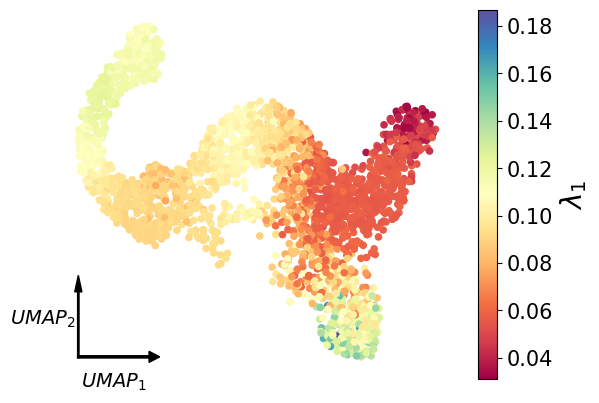

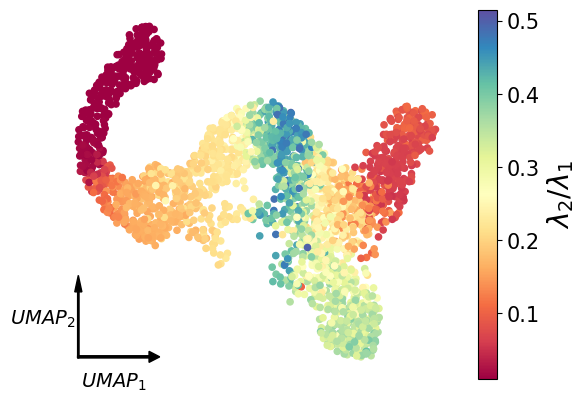

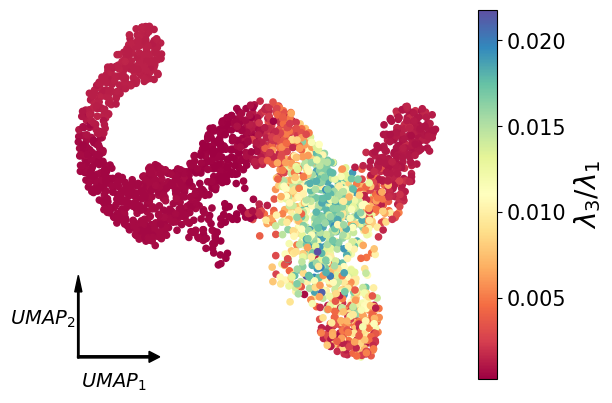

In [245]:
cmap = plt.colormaps['Spectral']
plt.scatter(X_plt[idx],Y_plt[idx], c=smooth_func(eigs_eg[:,0]), cmap=cmap, s=20)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel(f'$\lambda_{1}$',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*25,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+f'eig_eigen_{1}')
plt.show()

for k in range(1,eigen_dim):
    cmap = plt.colormaps['Spectral']
    plt.scatter(X_plt[idx],Y_plt[idx], c=smooth_func(eigs_eg[:,k]/eigs_eg[:,0]), cmap=cmap, s=20)
    plt.axis('off')

    clb=plt.colorbar()
    clb.ax.set_ylabel(f'$\lambda_{k+1}/\lambda_{1}$',fontsize=20,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)

    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
    plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
    plt.text(X_ori-wid*25,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

    plt.savefig(result_path+f'eig_ratio_eigen_{k+1}')
    plt.show()

In [246]:
np.save(result_path+'/fisher_eigen', Fisher_eg)
np.save(result_path+'/eig_eigen', eigs_eg)
np.save(result_path+'/eigvec_eigen', eigvecs_eg)

## **Fisher hotspot**

In [247]:
import hotspot

In [248]:
# Create the Hotspot object and the neighborhood graph
# hotspot works a lot faster with a csc matrix!
hs = hotspot.Hotspot(
    adata, 
    model='danb',
    distances_obsp_key = 'distances'
)

hs.create_knn_graph(
    weighted_graph=False, n_neighbors=30,
)

In [249]:
hs_results = hs.compute_autocorrelations(jobs=1)

hs_results.head(15)

100%|██████████| 514/514 [00:00<00:00, 1744.93it/s]


,C,Z,Pval,FDR
Gene,,,,
Ins2,0.921488,118.190269,0.0,0.0
Spp1,0.907251,111.548194,0.0,0.0
Neurog3,0.844194,106.495402,0.0,0.0
Nnat,0.843604,104.153512,0.0,0.0
Sparc,0.825746,101.241853,0.0,0.0
Btbd17,0.798096,99.313510,0.0,0.0
Cck,0.802819,99.025904,0.0,0.0
Fev,0.782238,94.343864,0.0,0.0
Gadd45a,0.751135,93.252398,0.0,0.0


In [250]:
# Select the genes with significant lineage autocorrelation
hs_genes = hs_results.loc[hs_results.FDR < 0.1].sort_values('Z', ascending=False).head(800).index

# Compute pair-wise local correlations between these genes
lcz = hs.compute_local_correlations(hs_genes, jobs=1)

Computing pair-wise local correlation on 505 features...


  0%|          | 0/505 [00:00<?, ?it/s]

100%|██████████| 127260/127260 [00:05<00:00, 21490.51it/s]


**Tuning parameter: min_gene_threshold**

In [251]:
modules = hs.create_modules(
    min_gene_threshold=40, core_only=True, fdr_threshold=0.1
)

modules.value_counts()
# np.save(result_path+'modules', modules.values)
# np.save(result_path+'hs_genes', hs_genes)

Module
 1    136
 2    126
 3    108
 4     94
-1     41
Name: count, dtype: int64

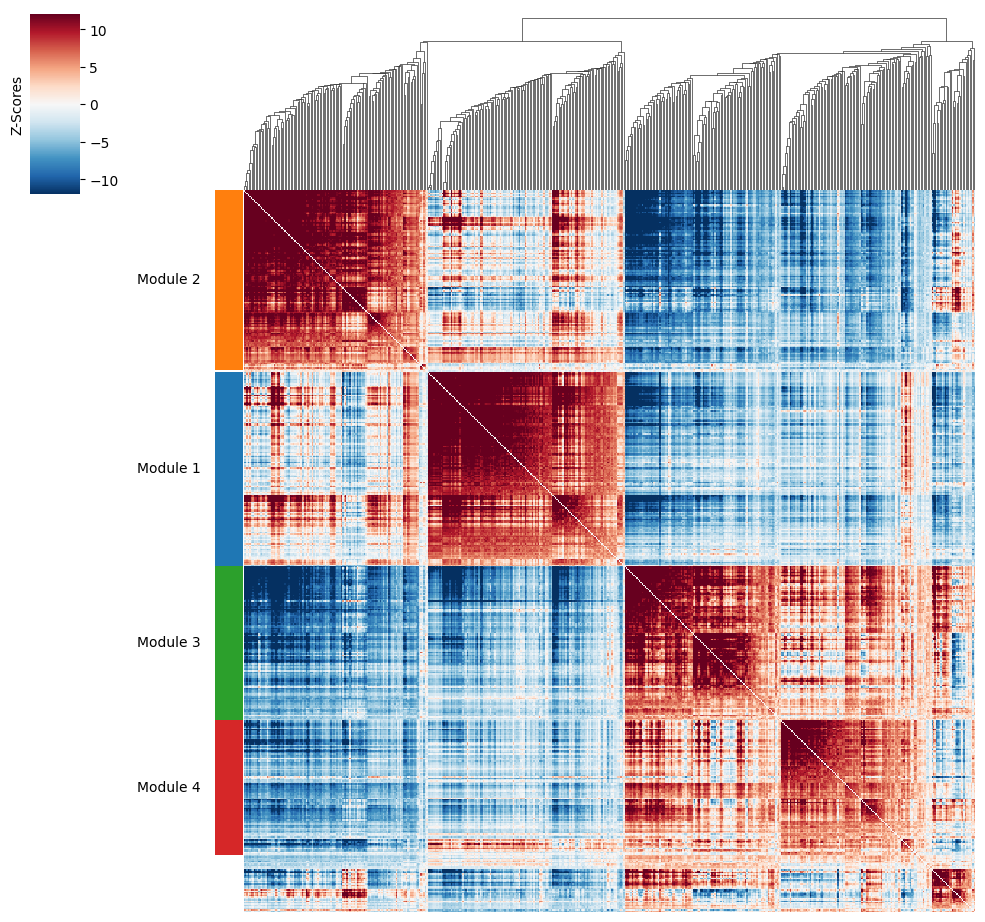

In [252]:
hs.plot_local_correlations(vmin=-12, vmax=12)

In [253]:
module_scores = hs.calculate_module_scores()

module_scores.head()

Computing scores for 4 modules...


100%|██████████| 4/4 [00:00<00:00,  5.74it/s]


,1,2,3,4
index,,,,
AAACCTGAGAGGGATA-1-3,-1.794335,-1.676232,0.740510,-0.879650
AAACCTGAGGCAATTA-1-3,-1.211114,-3.522860,3.673696,-1.122454
AAACCTGGTAAGTGGC-1-3,-1.674578,6.788901,-4.168490,-2.414337
AAACCTGTCCCTCTTT-1-3,-1.766464,-3.474962,5.539346,-0.637023
AAACGGGCAAAGAATC-1-3,-1.787283,-3.443280,2.534378,2.072316


In [254]:
module_cols = []
for c in module_scores.columns:
    key = f"Module {c}"
    adata.obs[key] = module_scores[c]
    module_cols.append(key)

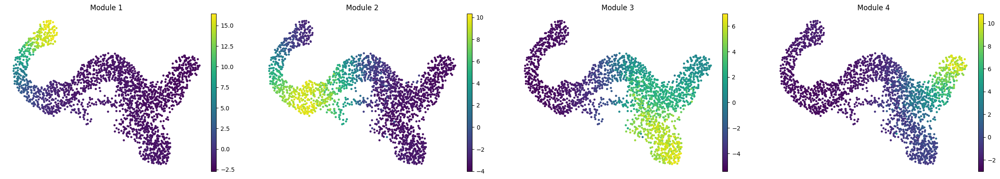

In [255]:
fig = sc.pl.umap(adata, color=module_cols, frameon=False, return_fig=True)

In [256]:
adata_hs = adata[:,hs_genes] # 只用hotspot有效的gene
T_hs = np.array(hs.modules.tolist()) # 记录所有hs gene的module
adata_hs.var_names

Index(['Ins2', 'Spp1', 'Neurog3', 'Nnat', 'Sparc', 'Btbd17', 'Cck', 'Fev',
       'Gadd45a', 'Tmem27',
       ...
       'Adgb', 'Pax6os1', 'Unc5c', 'Limch1', 'Gm15915', 'Fgf12', 'Rhoj',
       'Gm26760', 'Scn3a', 'Mblac2'],
      dtype='object', name='index', length=505)

In [257]:
scaler = StandardScaler()
X_hs = scaler.fit_transform(adata_hs.layers['Ms'])
hs_X_w = eigen_gene(X_hs,T_hs)
hs_dim=len(hs_X_w)
print(hs_dim)

[0.5694114  0.10320517]
[0.52475667 0.10216808]
[0.49819702 0.12364502]
[0.46168903 0.09788676]
4


In [258]:
cell_hs_X=np.zeros((X_hs.shape[0],hs_dim))
for j in range(X_hs.shape[0]):
    for k in range(len(hs_X_w)):
        cell_hs_X[j,k]=np.dot(hs_X_w[k],X_hs[j,T_hs==k+1])
# cell_hs_X = np.load(result_path+'cell_hs_X.npy')

In [259]:
model = nn.Sequential(
    nn.Linear(cell_hs_X.shape[1], 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,2*L),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

x_in=torch.tensor(cell_hs_X.astype(np.float32))
x_out=torch.tensor(latent_z.astype(np.float32))
# Train the model
for epoch in range(500):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Print loss for each epoch
#         print(f'Epoch {epoch+1}, Loss: {loss.item()}')

# Initialize a tensor to store the gradients
pZ_phs = np.zeros([cell_hs_X.shape[0], L*2, cell_hs_X.shape[1]])

# Compute the gradients
for i in range(cell_hs_X.shape[0]):
    x0=torch.tensor(cell_hs_X[i,:].astype(np.float32),requires_grad=True)
    z=model(x0)
    for j in range(2*L):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pZ_phs[i,j,:] = x0.grad.detach()
print(pZ_phs.shape)

(2322, 12, 4)


In [260]:
Fisher_hs = np.zeros((X.shape[0],hs_dim, hs_dim))
for i in range(X.shape[0]):
    Fisher_hs[i] = pZ_phs[i].T@Fisher_g[i]@pZ_phs[i]

In [261]:
eigs_hs = np.zeros((X.shape[0],hs_dim))
eigvecs_hs = np.zeros((X.shape[0],hs_dim, hs_dim))
for i in range(X.shape[0]):
    eig, eigvec = np.linalg.eig(Fisher_hs[i])
    sorted_indices = np.argsort(eig)[::-1]  # 从大到小排序
    eigs_hs[i] = eig[sorted_indices]
    eigvecs_hs[i] = eigvec[sorted_indices]

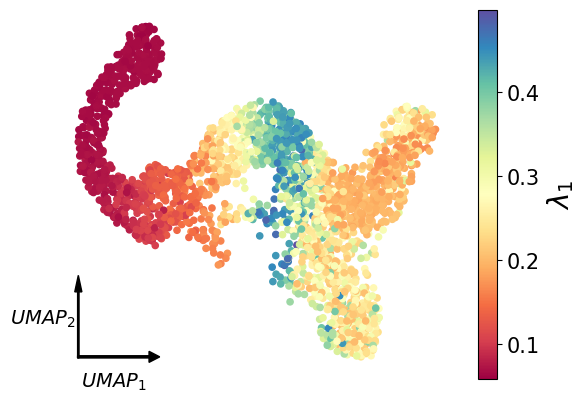

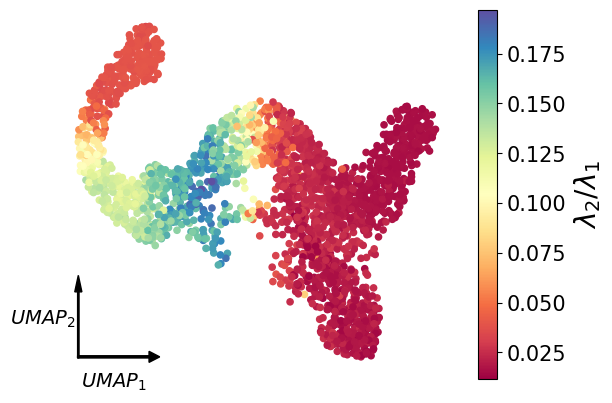

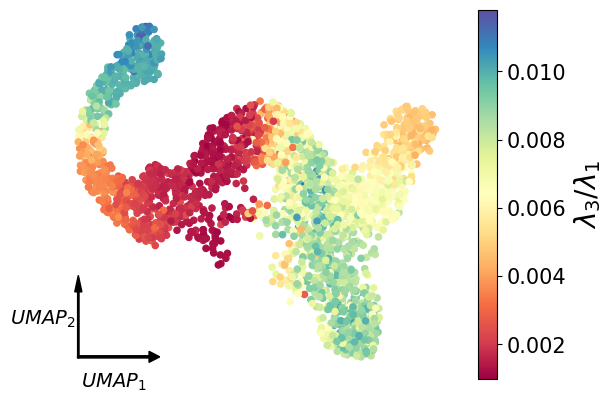

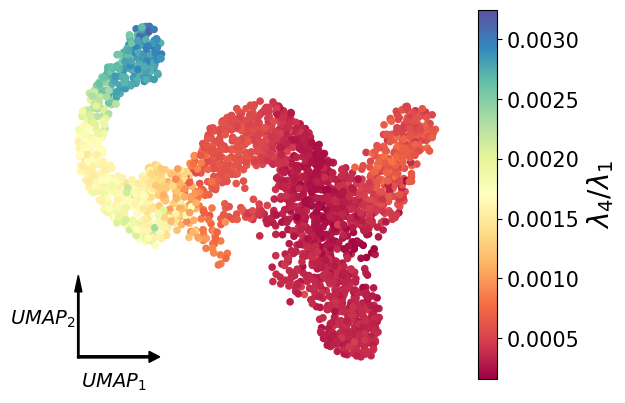

In [262]:
cmap = plt.colormaps['Spectral']
plt.scatter(X_plt[idx],Y_plt[idx], c=smooth_func(eigs_hs[:,0]), cmap=cmap, s=20)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel(f'$\lambda_{1}$',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*25,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+f'eig_hotspot_{1}')
plt.show()

for k in range(1,hs_dim):
    cmap = plt.colormaps['Spectral']
    plt.scatter(X_plt[idx],Y_plt[idx], c=smooth_func(eigs_hs[:,k]/eigs_hs[:,0]), cmap=cmap, s=20)
    plt.axis('off')

    clb=plt.colorbar()
    clb.ax.set_ylabel(f'$\lambda_{k+1}/\lambda_{1}$',fontsize=20,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)

    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
    plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
    plt.text(X_ori-wid*25,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

    plt.savefig(result_path+f'eig_ratio_hotspot_{k+1}')
    plt.show()

In [263]:
np.save(result_path+'/fisher_hotspot', Fisher_hs)
np.save(result_path+'/eig_hotspot', eigs_hs)
np.save(result_path+'/eigvec_hotspot', eigvecs_hs)

## **IV** ##

In [264]:
IV_latent = zv1_smooth

In [265]:
model = nn.Sequential(
    nn.Linear(pca_dim, 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,cell_eigen_X.shape[1]),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

x_in=torch.tensor(X_pca.astype(np.float32))
x_out=torch.tensor(cell_eigen_X.astype(np.float32))
# Train the model
for epoch in range(200):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
#     if epoch% 10 == 9:
#         print(epoch,loss)
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

pEg_pX = np.zeros([X.shape[0], cell_eigen_X.shape[1], X_pca.shape[1]])

# Compute the gradients
for i in range(X.shape[0]):
    x0=torch.tensor(X_pca[i,:],requires_grad=True)
    z=model(x0)
    for j in range(cell_eigen_X.shape[1]):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pEg_pX[i,j,:] = x0.grad.detach()

Eg_velo = np.array([pEg_pX[i]@velo_pca[i] for i in range(X.shape[0])])

Egv2 = np.zeros(X.shape[0])
for i in range(X.shape[0]):
    Egv2[i] = Eg_velo[i] @ Fisher_eg[i] @ Eg_velo[i].T
Egv1 = np.sqrt(Egv2)
IV_eigen = smooth_func(Egv1)

In [266]:
model = nn.Sequential(
    nn.Linear(pca_dim, 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,cell_hs_X.shape[1]),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

x_in=torch.tensor(X_pca.astype(np.float32))
x_out=torch.tensor(cell_hs_X.astype(np.float32))
# Train the model
for epoch in range(200):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
#     if epoch% 10 == 9:
#         print(epoch,loss)
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

phs_pX = np.zeros([X.shape[0], cell_hs_X.shape[1], X_pca.shape[1]])

# Compute the gradients
for i in range(X.shape[0]):
    x0=torch.tensor(X_pca[i,:],requires_grad=True)
    z=model(x0)
    for j in range(cell_hs_X.shape[1]):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        phs_pX[i,j,:] = x0.grad.detach()

hs_velo = np.array([phs_pX[i]@velo_pca[i] for i in range(X.shape[0])])

hsv2 = np.zeros(X.shape[0])
for i in range(X.shape[0]):
    hsv2[i] = hs_velo[i] @ Fisher_hs[i] @ hs_velo[i].T
hsv1 = np.sqrt(hsv2)
IV_hotspot = smooth_func(hsv1)

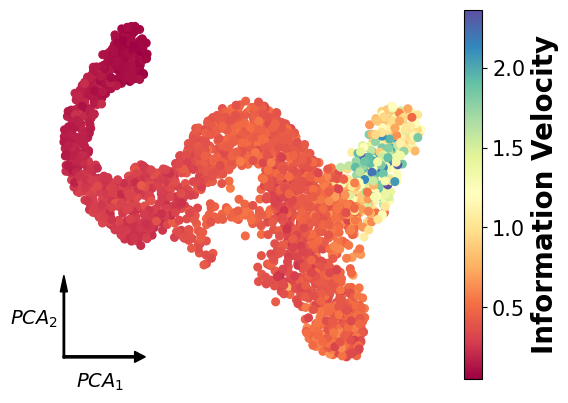

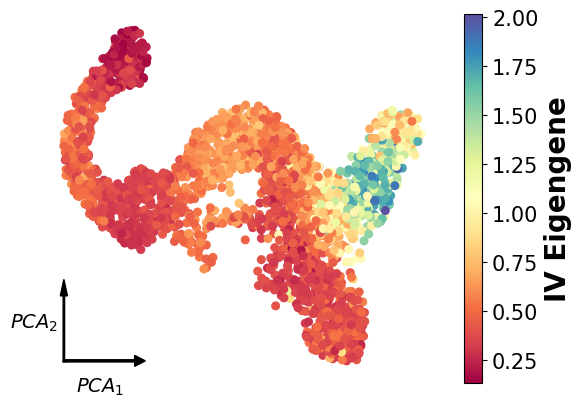

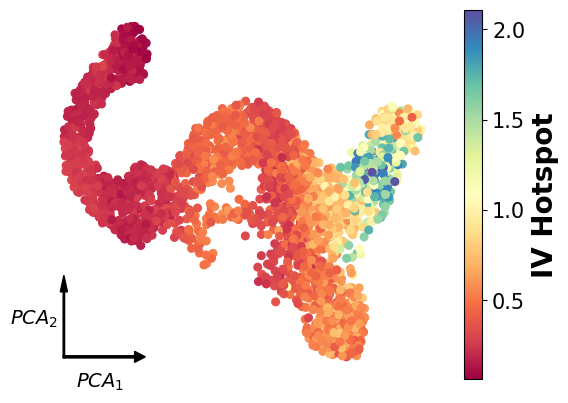

In [267]:
idx = ~np.isnan(zv1_smooth)
cmap = plt.colormaps['Spectral']
plt.scatter(X_plt[idx],Y_plt[idx],c=IV_latent[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('Information Velocity',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$PCA_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*21,Y_ori+Y_len/2,'$PCA_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'iv')
plt.show()

# IV Eg
plt.scatter(X_plt[idx],Y_plt[idx],c=IV_eigen[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('IV Eigengene',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$PCA_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*21,Y_ori+Y_len/2,'$PCA_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'iv_eg')
plt.show()

# IV Hotspot
plt.scatter(X_plt[idx],Y_plt[idx],c=IV_hotspot[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('IV Hotspot',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$PCA_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*21,Y_ori+Y_len/2,'$PCA_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'iv_hotspot')
plt.show()

In [269]:
np.save(result_path+'cell_hs_X.npy', cell_hs_X)